# King County House Price Exploratory Data Analyses
- **stakeholder** : Bonnie Brown (Seller)  
He has a house and wants to move soon (timing?), but wants high profit in middle class NH (neighborhood)
## Hypothesis:
- House prices are high in city center and low in suburban
- Houses with waterfront are expensive than without 
- Most of the houses are sold in mid of the year ( Jun –July)
- After renovation the the seller will get more profits


## Dataset

A dataset has been provided and can be found in the `kc_house_data.csv` file in this repository.

The column names and descriptions are provided in the `column_names.md` file in this repository.   
For convenience they have been reproduced below.

|   Column       | Description  |
| ------------- :|:-------------:|
|  **id**  | unique identified for a house|
| **dateDate** | house was sold|
| **pricePrice** |  is prediction target|
| **bedroomsNumber** |  # of bedrooms|
| **bathroomsNumber** | # of bathrooms|
| **sqft_livingsquare** |  footage of the home|
| **sqft_lotsquare** |  footage of the lot|
| **floorsTotal** |  floors (levels) in house|
| **waterfront** | House which has a view to a waterfront|
| **view** | Has been viewed|
| **condition** | How good the condition is ( Overall )|
| **grade** | overall grade given to the housing unit, based on King County grading system|
| **sqft_above** | square footage of house apart from basement|
| **sqft_basement** | square footage of the basement|
| **yr_built** | Built Year|
| **yr_renovated** | Year when house was renovated|
| **zipcode** | zip|
| **lat** | Latitude coordinate|
| **long** | Longitude coordinate|
| **sqft_living15** | The square footage of interior housing living space for the nearest 15 neighbors|
| **sqft_lot15** | The square footage of the land lots of the nearest 15 neighbors|

## Importing required libraries

In [1]:
import pandas as pd
import numpy as np
from datetime import datetime
import json

from scipy import stats
import statsmodels.api as sms
import statsmodels.formula.api as smf

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import folium

import geopandas as gpd



from bokeh.io import output_notebook, show, output_file
from bokeh.plotting import figure, ColumnDataSource
from bokeh.tile_providers import get_provider, CARTODBPOSITRON
from bokeh.palettes import Turbo256, RdYlGn
from bokeh.transform import linear_cmap,factor_cmap
from bokeh.layouts import row, column
from bokeh.models import GeoJSONDataSource, LinearColorMapper, ColorBar, NumeralTickFormatter

%matplotlib inline

### Importing the data in DataFrame

In [2]:
# Importing the kings Country House Data
kch_data = pd.read_csv('../data/King_County_House_prices_dataset.csv')
kch_data.head(2)

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,10/13/2014,221900.0,3,1.00,1180,5650,1.0,NaN,0.0,...,7,1180,0.0,1955,0.0,98178,47.5112,-122.257,1340,5650
1,6414100192,12/9/2014,538000.0,3,2.25,2570,7242,2.0,0.0,0.0,...,7,2170,400.0,1951,1991.0,98125,47.7210,-122.319,1690,7639


In [3]:
print(f'The number of price obseravation are {kch_data.shape[0]} on {kch_data.shape[1]} house features')

The number of price obseravation are 21597 on 21 house features


### Checking for and Dropping duplicates

In [4]:
duplicates = kch_data[kch_data.duplicated()]
print(f'duplicates are {len(duplicates)}, originals are {len(kch_data)}')

duplicates are 0, originals are 21597


In [5]:
# Checking for duplicates
df_duplicate = kch_data[kch_data.duplicated(subset=['id'],keep=False)].reset_index()
df_duplicate.sort_values(by = 'id').head()

,index,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
39,2495,1000102,4/22/2015,300000.0,6,3.00,2400,9373,2.0,0.0,...,7,2400,0.0,1991,0.0,98002,47.3262,-122.214,2060,7316
38,2494,1000102,9/16/2014,280000.0,6,3.00,2400,9373,2.0,NaN,...,7,2400,0.0,1991,0.0,98002,47.3262,-122.214,2060,7316
298,16800,7200179,10/16/2014,150000.0,2,1.00,840,12750,1.0,0.0,...,6,840,0.0,1925,0.0,98055,47.4840,-122.211,1480,6969
299,16801,7200179,4/24/2015,175000.0,2,1.00,840,12750,1.0,0.0,...,6,840,0.0,1925,NaN,98055,47.4840,-122.211,1480,6969
199,11422,109200390,10/20/2014,250000.0,3,1.75,1480,3900,1.0,0.0,...,7,1480,0.0,1980,0.0,98023,47.2977,-122.367,1830,6956


There are duplicate `id`'s identified but the price data is not same as previous observation. This house has came into market for more than one timehouse has soldout more than one time hence the duplicats have not been removed for the analyses.

### Checking the data, Data Types

In [6]:
kch_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             21597 non-null  int64  
 1   date           21597 non-null  object 
 2   price          21597 non-null  float64
 3   bedrooms       21597 non-null  int64  
 4   bathrooms      21597 non-null  float64
 5   sqft_living    21597 non-null  int64  
 6   sqft_lot       21597 non-null  int64  
 7   floors         21597 non-null  float64
 8   waterfront     19221 non-null  float64
 9   view           21534 non-null  float64
 10  condition      21597 non-null  int64  
 11  grade          21597 non-null  int64  
 12  sqft_above     21597 non-null  int64  
 13  sqft_basement  21597 non-null  object 
 14  yr_built       21597 non-null  int64  
 15  yr_renovated   17755 non-null  float64
 16  zipcode        21597 non-null  int64  
 17  lat            21597 non-null  float64
 18  long  


**From above the followings are absorved:**
- `date` feature is identified as `object` instead of `DateTime type` need to be corrected
- NaN values identified within `waterfront, view, yr_renovated` and need to be cleaned
- `sqft_basement` feature is identified as `object` instead of `float type` need to be corrected

### Change datatype of `date` column from `str` to `DateTime`

In [7]:
# transforming data from object to datetime64 data type
kch_data['date'] = pd.to_datetime(kch_data['date'])
# create new columns with year and month data
kch_data['yr_sold'] = pd.DatetimeIndex(kch_data['date']).year
kch_data['mth_sold'] = pd.DatetimeIndex(kch_data['date']).month
#kch_data = kch_data('date', axis = 1)
kch_data = kch_data.drop("date",axis = 1)
kch_data = kch_data.drop("id",axis = 1)

In [8]:
kch_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   price          21597 non-null  float64
 1   bedrooms       21597 non-null  int64  
 2   bathrooms      21597 non-null  float64
 3   sqft_living    21597 non-null  int64  
 4   sqft_lot       21597 non-null  int64  
 5   floors         21597 non-null  float64
 6   waterfront     19221 non-null  float64
 7   view           21534 non-null  float64
 8   condition      21597 non-null  int64  
 9   grade          21597 non-null  int64  
 10  sqft_above     21597 non-null  int64  
 11  sqft_basement  21597 non-null  object 
 12  yr_built       21597 non-null  int64  
 13  yr_renovated   17755 non-null  float64
 14  zipcode        21597 non-null  int64  
 15  lat            21597 non-null  float64
 16  long           21597 non-null  float64
 17  sqft_living15  21597 non-null  int64  
 18  sqft_l

### Cleaning and Changing waterfront datatype `float` to catogorical variable

In [9]:
kch_data['waterfront'].value_counts(normalize=True)

0.0    0.992404
1.0    0.007596
Name: waterfront, dtype: float64

For `waterfront`, all `NAN` values were replaced with `0` since over 99% of the ‘waterfront’ values in the data set are already `0`. and further noted that this feature is a categorical vaiable, with value `1` or `0`.

In [10]:
# all NAN values are replaced by 0.
kch_data['waterfront']= kch_data['waterfront'].fillna(0)
kch_data['waterfront']= kch_data['waterfront'].astype('category')

### Cleaning and Changing `view` column datatype to catogorical variable

In [11]:
kch_data['view'].value_counts(normalize=True)

0.0    0.901923
2.0    0.044441
3.0    0.023591
1.0    0.015325
4.0    0.014721
Name: view, dtype: float64

For `view`, all `NAN` values were replaced with 0 since over 90% of the `view` values in the data set are already 0.

In [12]:
# Define function viewed
def has_viewed(df):
    '''creates bool feature viewed and drops original view feature'''
    # all NAN values are replaced by 0
    kch_data['view']= kch_data['view'].fillna(0)
    df['has_viewed'] = df['view'].map(lambda x: 1 if x > 0 else 0)
    df = df.drop('view', axis = 1)
    return df

In [13]:
# Has house viewd or not? Yes = 1, No = 0.
kch_data = has_viewed(kch_data)
kch_data['has_viewed']= kch_data['has_viewed'].astype('category')

### Cleaning `yr_renovated`column and replaced by `has_renovated` with bool values

For `yr_renovated`, all `NAN` values were replaced with `0`.

We will choose to only consider renovations which took place from 1990 onwards, on the basis that earlier renovations are likely to be obsolete. Let us create a new feature was_renovated_post90 which has value 1 if the house was renovated post 1990 and 0 otherwise.

In [14]:
# all NAN values are replaced by 0 or mean depends on the feature.
kch_data['yr_renovated'] = kch_data['yr_renovated'].fillna(0)
kch_data["yr_renovated"] = kch_data["yr_renovated"].astype("category")

In [15]:
# Define function to create was_renovated_post90 feature
kch_data['has_renovated'] = kch_data['yr_renovated'].map(lambda x: 1 if x > 1990 else 0)
kch_data['has_renovated'] = kch_data['has_renovated'].astype("category")
kch_data = kch_data.drop('yr_renovated', axis = 1)

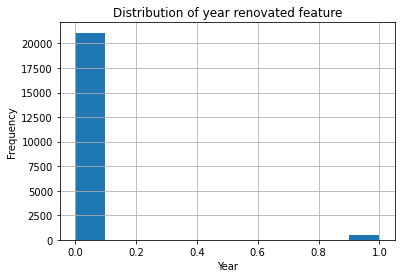

In [16]:
# Obsolate renovation made post 1990 year and asignend
kch_data['has_renovated'].hist()
plt.xlabel("Year")
plt.ylabel('Frequency')
plt.title("Distribution of year renovated feature")
plt.show()

In [17]:
kch_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype   
---  ------         --------------  -----   
 0   price          21597 non-null  float64 
 1   bedrooms       21597 non-null  int64   
 2   bathrooms      21597 non-null  float64 
 3   sqft_living    21597 non-null  int64   
 4   sqft_lot       21597 non-null  int64   
 5   floors         21597 non-null  float64 
 6   waterfront     21597 non-null  category
 7   condition      21597 non-null  int64   
 8   grade          21597 non-null  int64   
 9   sqft_above     21597 non-null  int64   
 10  sqft_basement  21597 non-null  object  
 11  yr_built       21597 non-null  int64   
 12  zipcode        21597 non-null  int64   
 13  lat            21597 non-null  float64 
 14  long           21597 non-null  float64 
 15  sqft_living15  21597 non-null  int64   
 16  sqft_lot15     21597 non-null  int64   
 17  yr_sold        21597 non-null  

### Cleaning of `sqft_basement` column and changed to `has_basement`as categorical data

In [18]:
kch_data["sqft_basement"].value_counts() , kch_data["sqft_basement"].describe() 

(0.0       12826
 ?           454
 600.0       217
 500.0       209
 700.0       208
           ...  
 4820.0        1
 417.0         1
 508.0         1
 2310.0        1
 3000.0        1
 Name: sqft_basement, Length: 304, dtype: int64,
 count     21597
 unique      304
 top         0.0
 freq      12826
 Name: sqft_basement, dtype: object)

As we saw that `sqft_basement` had mostly 0 values, indicating no basement, let us create a new feature `has_basement` which has value `1` if the house has a basement and `0` otherwise. We will then drop the original `sqft_basement` variable.

In [19]:
def has_basement(df):
    '''creates bool feature has_basement and drops original basement feature'''
    df['sqft_basement'] = df['sqft_basement'].map(lambda x : float(x.replace('?', '0')))
    df['has_basement'] = df['sqft_basement'].map(lambda x: 1 if x > 0 else 0)
    df['has_basement'] = df['has_basement'].astype("category")
    df = df.drop('sqft_basement', axis = 1)
    return df

In [20]:
# Has house basement or not? Yes = 1, No = 0.
kch_data = has_basement(kch_data)
kch_data['has_basement'].describe()

count     21597
unique        2
top           0
freq      13280
Name: has_basement, dtype: int64

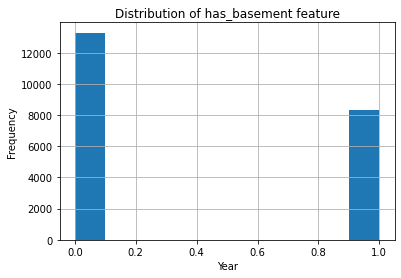

In [21]:
kch_data['has_basement'].hist()
plt.xlabel("Year")
plt.ylabel('Frequency')
plt.title("Distribution of has_basement feature")
plt.show()

### Creating a new feature `sold_at_age` based on `yr_built`data

In [22]:
kch_data["sold_at_age"] = kch_data["yr_sold"] - kch_data["yr_built"]
kch_data["sold_at_age"] = kch_data["sold_at_age"].apply(lambda x: x if x > 0 else 0)
kch_data = kch_data.drop("yr_built",axis = 1)

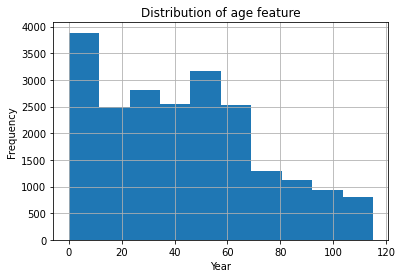

In [23]:
kch_data['sold_at_age'].hist()
plt.xlabel("Year")
plt.ylabel('Frequency')
plt.title("Distribution of age feature")
plt.show()

from above histograme observed that the number of houses built are  distributed majorly in 4 catogories. therefore bins are define for the `sold_at_age` feature to treated as a categorical variable. We will use the summary statistics (quartiles) to define our bins, so that we have roughly the same number of data points in each bin.

In [24]:
kch_data = kch_data[kch_data['sold_at_age'] < 70]

In [25]:
col = 'sold_at_age'
yr_age_bins = np.arange(kch_data[col].min(), kch_data[col].max()+11,10)
yr_age_bins

array([ 0, 10, 20, 30, 40, 50, 60, 70])

In [26]:
# Define function to map yr_built into bins
def house_age(df,col):
    ''' Maps yr_built to sold_at_age feature into categorical bins'''
    
    # Define bins based on statistics
    house_age_bins = np.arange(kch_data[col].min(), kch_data[col].max()+11,10)
    
    # Map to bins using pd.cut()
    house_age_series = pd.cut(df[col],bins = house_age_bins,labels = house_age_bins[0:-1])
    house_age_series.name = col+'_bin'
    
    #yr_built_labels = ['pre1950', '1950_to_1975', '1975_to_1997', '1997_to_2015']
    # Join the DataFrames
    df = pd.concat([df,house_age_series], axis=1)
    
    return df

In [27]:
kch_data = house_age(kch_data,'sold_at_age')
kch_data['sold_at_age_bin'].unique()
kch_data = kch_data.drop('sold_at_age', axis = 1)

We saw that view had mostly 0 values, indicating not been viewed, let us create a new feature viewed which has value 1 if the house has been viewed and 0 otherwise. We will drop the original view variable.

### Cleaning `bathroom`data and rounded to nearest integer value and convetred to category

In [28]:
# Get unique values
kch_data['bathrooms'].unique()

array([1.  , 2.25, 3.  , 2.  , 4.5 , 1.5 , 2.5 , 1.75, 2.75, 3.25, 4.  ,
       3.5 , 4.75, 5.  , 0.75, 4.25, 3.75, 1.25, 5.25, 6.  , 0.5 , 5.5 ,
       6.75, 5.75, 7.5 , 7.75, 8.  , 6.25, 6.5 ])

From the data dictionnary, we note that the bathroom variable indicated the number of bathrooms per bedrooms. However this is unlikely as the max figure is 8 and the median is 2.25, which wouldn't make sense. From additional research, we found that it relates to overall bathroom count with a float denoting say a toilet but no shower. 

In [29]:
# number of bathroms rounded to nearest integer in order to condider as catagorical variable.
def to_category_feature(df,col):
    '''int / float feature to category feature'''
    df[col] = df[col].astype('category')
    return df
def round_rooms(df,col):
    '''Round room feature and convert to int and then category'''
    df[col] = df[col].map(lambda x: int(round(x,0)))
    #df[col] = df[col].astype('category')
    to_category_feature(df,col)
    return df

In [30]:
kch_data = round_rooms(kch_data,'bathrooms')
kch_data = round_rooms(kch_data,'bedrooms')

In [31]:
#kch_data = to_category_feature(kch_data,'grade')
#kch_data = to_category_feature(kch_data,'condition')
#kch_data = to_category_feature(kch_data,'zipcode')

In [32]:
kch_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 17549 entries, 0 to 21596
Data columns (total 21 columns):
 #   Column           Non-Null Count  Dtype   
---  ------           --------------  -----   
 0   price            17549 non-null  float64 
 1   bedrooms         17549 non-null  category
 2   bathrooms        17549 non-null  category
 3   sqft_living      17549 non-null  int64   
 4   sqft_lot         17549 non-null  int64   
 5   floors           17549 non-null  float64 
 6   waterfront       17549 non-null  category
 7   condition        17549 non-null  int64   
 8   grade            17549 non-null  int64   
 9   sqft_above       17549 non-null  int64   
 10  zipcode          17549 non-null  int64   
 11  lat              17549 non-null  float64 
 12  long             17549 non-null  float64 
 13  sqft_living15    17549 non-null  int64   
 14  sqft_lot15       17549 non-null  int64   
 15  yr_sold          17549 non-null  int64   
 16  mth_sold         17549 non-null  int64  

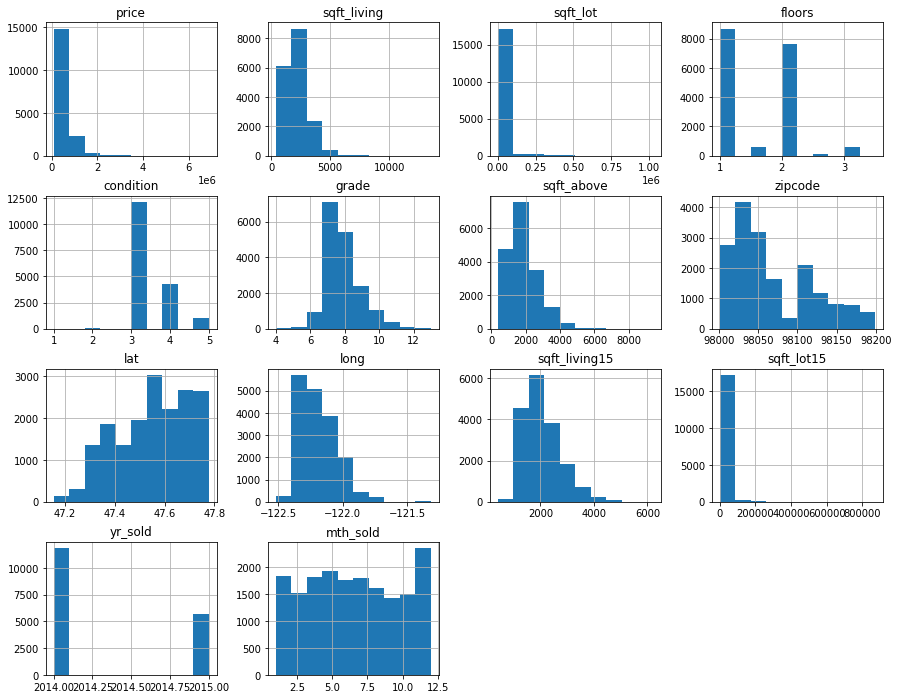

In [33]:
kch_data.hist(figsize = (15,12))
plt.show()

## Analyses of price distribution
Let us also investigate the target variable `price` to see if we want to make any further adjustments to exclude outliers.

In [34]:
print(kch_data['price'].describe().round(3))

count      17549.000
mean      534498.580
std       359129.326
min        82000.000
25%       320000.000
50%       445000.000
75%       635000.000
max      6890000.000
Name: price, dtype: float64


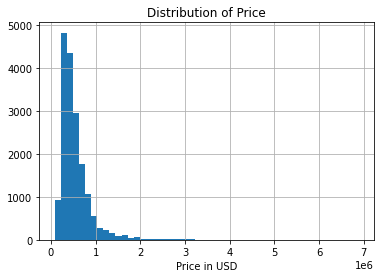

In [35]:
kch_data['price'].hist(bins=50)
plt.xlabel('Price in USD')
plt.title('Distribution of Price')
plt.show()

In [36]:
# Look at 0.9 percentile
for i in range (90,100):
    q = i/100
    quantile = kch_data['price'].quantile(q = q)
    print(f'{q} percentile: {round(quantile,3)}')

0.9 percentile: 880000.0
0.91 percentile: 910000.0
0.92 percentile: 950000.0
0.93 percentile: 989957.6
0.94 percentile: 1050000.0
0.95 percentile: 1150000.0
0.96 percentile: 1250000.0
0.97 percentile: 1390000.0
0.98 percentile: 1600000.0
0.99 percentile: 1930000.0


<Figure size 648x576 with 0 Axes>

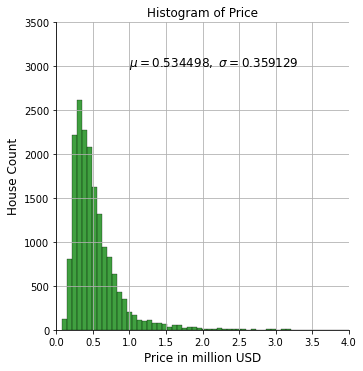

In [37]:
Mean = int(kch_data['price'].mean())
Std = int(kch_data['price'].std())
plt.figure(figsize=(9, 8))
sns.displot(kch_data['price']/1000000, color='g', bins=100);
#plt.figure(figsize=(8, 8))
#n , bins, patches = plt.hist(kch_data['price'], 100, density = True,facecolor='g', alpha=0.75)
plt.xlabel('Price in million USD', fontsize = 12)
plt.ylabel('House Count', fontsize = 12)
plt.title('Histogram of Price', fontsize = 12)
plt.text(1, 3000, f"$\mu={Mean/1000000},\ \sigma={Std/1000000}$",fontsize=12)
plt.xlim(0, 4)
plt.ylim(0, 3500)
plt.grid(True)
plt.show()

Let us remove houses with price above $1.6m. These can be studied separately as part of a wider project as there are likely to be additional aspects relevant only to these types of houses. Moreoever, these homeowners are unlikely to respond to an advertising campaign and stakeholders may wish to consider a more bespoke service.

In [38]:
kch_data = kch_data[kch_data['price']<1600000]
kch_df1=kch_data.copy()

<Figure size 648x576 with 0 Axes>

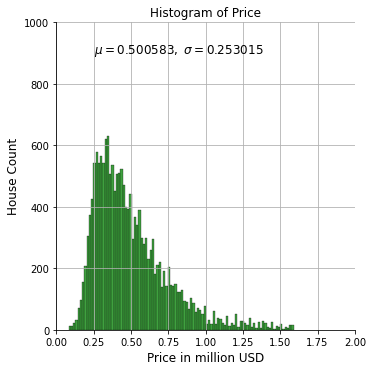

In [39]:
Mean = int(kch_df1['price'].mean())
Std = int(kch_df1['price'].std())
plt.figure(figsize=(9, 8))
sns.displot(kch_df1['price']/1000000, color='g', bins=100);
#plt.figure(figsize=(8, 8))
#n , bins, patches = plt.hist(kch_data['price'], 100, density = True,facecolor='g', alpha=0.75)
plt.xlabel('Price in million USD', fontsize = 12)
plt.ylabel('House Count', fontsize = 12)
plt.title('Histogram of Price', fontsize = 12)
plt.text(0.25, 900, f"$\mu={Mean/1000000},\ \sigma={Std/1000000}$",fontsize=12)
plt.xlim(0, 2)
plt.ylim(0, 1000)
plt.grid(True)
plt.show()

In [40]:
kch_df1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 17196 entries, 0 to 21596
Data columns (total 21 columns):
 #   Column           Non-Null Count  Dtype   
---  ------           --------------  -----   
 0   price            17196 non-null  float64 
 1   bedrooms         17196 non-null  category
 2   bathrooms        17196 non-null  category
 3   sqft_living      17196 non-null  int64   
 4   sqft_lot         17196 non-null  int64   
 5   floors           17196 non-null  float64 
 6   waterfront       17196 non-null  category
 7   condition        17196 non-null  int64   
 8   grade            17196 non-null  int64   
 9   sqft_above       17196 non-null  int64   
 10  zipcode          17196 non-null  int64   
 11  lat              17196 non-null  float64 
 12  long             17196 non-null  float64 
 13  sqft_living15    17196 non-null  int64   
 14  sqft_lot15       17196 non-null  int64   
 15  yr_sold          17196 non-null  int64   
 16  mth_sold         17196 non-null  int64  

In [41]:
# price per square feet
kch_df1['price_per_sqft'] = kch_df1['price'] / kch_df1['sqft_living']

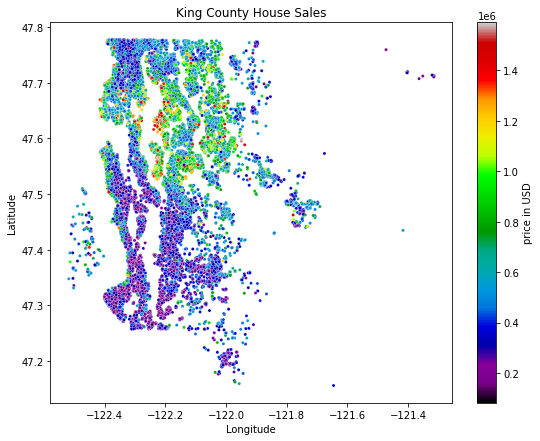

In [42]:
plt.figure(figsize = (9,7))
ax = sns.scatterplot(x = kch_df1['long'], y = kch_df1['lat'], hue = kch_df1['price'],
                palette = 'nipy_spectral',s=10, legend = None, data = kch_df1)

norm = plt.Normalize(kch_df1['price'].min(), kch_df1['price'].max())
smap = plt.cm.ScalarMappable(cmap='nipy_spectral', norm=norm)
smap.set_array([])

ax.figure.colorbar(smap, label = 'price in USD')

plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('King County House Sales')
plt.show()

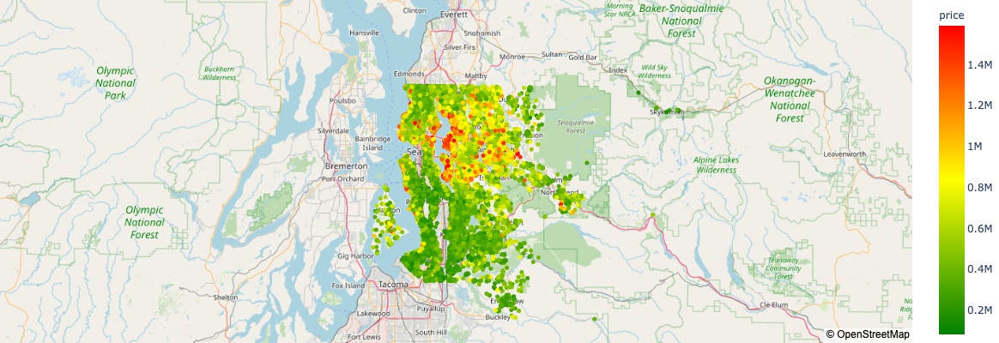

<Figure size 648x504 with 0 Axes>

In [43]:
plt.figure(figsize = (9,7))
fig = px.scatter_mapbox(kch_df1, lat ='lat', lon = 'long', color = 'price', color_continuous_scale = ['green','yellow','red'],color_discrete_sequence = ['fuchsia'],zoom = 7.7, height = 400)
fig.update_layout(mapbox_style = 'open-street-map')
fig.update_layout(margin={'r':0,'t':0,'l':0,'b':0})
fig.show()

## House prices per zipcode
Let us now focus on zipcode information, which was provided as part of our starting data.

In [44]:
# Explore zipcode
kch_df1['zipcode'].value_counts()

98038    583
98052    565
98042    541
98034    524
98023    490
        ... 
98024     57
98148     51
98102     44
98109     32
98039     14
Name: zipcode, Length: 70, dtype: int64

We see that there are 70 unique zipcodes represented in our dataset. 

Let us create a heatmap to explore the median house price per zipcode and see if we can establish zipcode 'tiers'. We will make use of a geojson file showing the zip code boundaries and extract `price` and `zipcode` data from our dataset.

In [45]:
# Extract price and zipcode from our dataset
dfrel = kch_df1[['zipcode', 'price']]

# Groupby zipcode and take median price
dfrel = dfrel.groupby(dfrel['zipcode']).mean()

# Reset index after groupy
dfrel = dfrel.reset_index()

# Change type to str
dfrel['zipcode'] = dfrel['zipcode'].astype(str)

# Rename column to match type
dfrel = dfrel.rename(columns = {'zipcode' : 'ZIPCODE'})

# Check
dfrel.head()

,ZIPCODE,price
0,98001,283671.422741
1,98002,239345.018182
2,98003,293007.818841
3,98004,995477.337963
4,98005,780794.253086


#### Neighborhood Dataset

In [46]:
data_dict = {98074: 1, 98029: 2, 98052: 3, 98075: 4, 98005: 5, 98006: 6, 98007: 7, 98004: 8, 98008: 9, 98040: 10, 98053: 11, 98039: 12, 98033: 13, 98021: 14, 98027: 15, 98065: 16, 98110: 17, 98607: 18, 98059: 19, 99203: 20, 98077: 21, 98115: 22, 98028: 23, 98011: 24, 98034: 25, 98012: 26, 98117: 27, 98144: 28, 98112: 29, 98072: 30, 98103: 31, 98155: 32, 98177: 33, 98199: 34, 98122: 35, 98119: 36, 98327: 37, 98038: 38, 98116: 39, 98105: 40, 98109: 41, 99354: 42, 99019: 43, 99353: 44, 98024: 45, 98125: 46, 98126: 47, 98118: 48, 99223: 49, 99338: 50, 98275: 51, 98136: 52, 98019: 53, 98102: 54, 98296: 55, 98058: 56, 98106: 57, 98121: 58, 98229: 59, 98501: 60, 98506: 61, 99352: 62, 99163: 63, 98107: 64, 98036: 65, 98133: 66, 98056: 67, 98502: 68, 98388: 69, 98108: 70, 98467: 71, 98466: 72, 99208: 73, 98020: 74, 98516: 75, 98045: 76, 98031: 77, 99016: 78, 98685: 79, 98823: 80, 99021: 81, 98026: 82, 98383: 83, 98208: 84, 99204: 85, 98037: 86, 98683: 87, 98043: 88, 98101: 89, 98406: 90, 98424: 91, 98503: 92, 98092: 93, 99224: 94, 98087: 95, 98368: 96, 98422: 97, 98010: 98, 98178: 99, 98392: 100, 98042: 101, 98439: 102, 98370: 103, 98146: 104, 98335: 105, 98512: 106, 98104: 107, 98391: 108, 99205: 109, 98277: 110, 98403: 111, 98221: 112, 99301: 113, 99111: 114, 98390: 115, 98404: 116, 99336: 117, 98371: 118, 98332: 119, 98513: 120, 98682: 121, 98311: 122, 99202: 123, 98055: 124, 98375: 125, 98047: 126, 98498: 127, 98374: 128, 98373: 129, 98225: 130, 98801: 131, 99217: 132, 99207: 133, 99218: 134, 98001: 135, 98405: 136, 98836: 137, 98205: 138, 99037: 139, 98226: 140, 99337: 141, 98014: 142, 98003: 143, 99206: 144, 99362: 145, 98023: 146, 98815: 147, 99022: 148, 98684: 149, 98002: 150, 98802: 151, 98203: 152, 98606: 153, 98908: 154, 98563: 155, 98903: 156, 98204: 157, 98166: 158, 98188: 159, 98030: 160, 98443: 161, 98671: 162, 98686: 163, 98372: 164, 98333: 165, 98642: 166, 98664: 167, 98032: 168, 98258: 169, 98148: 170, 98409: 171, 99324: 172, 98826: 173, 98290: 174, 98418: 175, 98665: 176, 98273: 177, 98407: 178, 98329: 179, 98841: 180, 98198: 181, 98408: 182, 99004: 183, 99212: 184, 98605: 185, 98248: 186, 98586: 187, 99201: 188, 98346: 189, 98312: 190, 98901: 191, 98321: 192, 99350: 193, 98840: 194, 98230: 195, 98663: 196, 99114: 197, 98057: 198, 98902: 199, 98362: 200, 98444: 201, 98349: 202, 99323: 203, 98837: 204, 98520: 205, 98953: 206, 98201: 207, 98354: 208, 98295: 209, 98272: 210, 99328: 211, 98532: 212, 99403: 213, 98168: 214, 98661: 215, 98816: 216, 98342: 217, 98264: 218, 98499: 219, 98247: 220, 98662: 221, 98022: 222}
data_items = data_dict.items()
data_list = list(data_items)

neighborhood_df = pd.DataFrame(data_list)
neighborhood_df.columns = ['ZIPCODE','nh']
neighborhood_df['ZIPCODE'] = neighborhood_df['ZIPCODE'].astype('str')
neighborhood_df.info()
neighborhood_df


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 222 entries, 0 to 221
Data columns (total 2 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   ZIPCODE  222 non-null    object
 1   nh       222 non-null    int64 
dtypes: int64(1), object(1)
memory usage: 3.6+ KB


,ZIPCODE,nh
0,98074,1
1,98029,2
2,98052,3
3,98075,4
4,98005,5
...,...,...
217,98264,218
218,98499,219
219,98247,220
220,98662,221


In [47]:
dfrel = dfrel.merge(neighborhood_df, how = 'left', on = 'ZIPCODE')
dfrel

,ZIPCODE,price,nh
0,98001,283671.422741,135.0
1,98002,239345.018182,150.0
2,98003,293007.818841,143.0
3,98004,995477.337963,8.0
4,98005,780794.253086,5.0
...,...,...,...
65,98177,610184.930556,33.0
66,98178,328305.314286,99.0
67,98188,294072.208333,159.0
68,98198,301739.235521,181.0


In [48]:
geodatafilename = '../data/Zipcodes_for_King_County_and_Surrounding_Area_Shorelines__zipcode_shore_area.geojson'
gdf = gpd.read_file(geodatafilename)
gdf[:3]

,OBJECTID,ZIP,ZIPCODE,COUNTY,ZIP_TYPE,Shape_Length,Shape_Area,geometry
0,1,98031,98031,033,Standard,117508.231410,2.280129e+08,"POLYGON ((-122.21842 47.43750, -122.21896 47.4..."
1,2,98032,98032,033,Standard,166737.665152,4.826754e+08,"MULTIPOLYGON (((-122.24187 47.44122, -122.2436..."
2,3,98033,98033,033,Standard,101363.832386,2.566747e+08,"POLYGON ((-122.20571 47.65170, -122.20571 47.6..."


In [49]:
merged = gdf.merge(dfrel, how = 'left', on = 'ZIPCODE')
merged.head()

,OBJECTID,ZIP,ZIPCODE,COUNTY,ZIP_TYPE,Shape_Length,Shape_Area,geometry,price,nh
0,1,98031,98031,033,Standard,117508.231410,2.280129e+08,"POLYGON ((-122.21842 47.43750, -122.21896 47.4...",300053.395522,77.0
1,2,98032,98032,033,Standard,166737.665152,4.826754e+08,"MULTIPOLYGON (((-122.24187 47.44122, -122.2436...",256722.869565,168.0
2,3,98033,98033,033,Standard,101363.832386,2.566747e+08,"POLYGON ((-122.20571 47.65170, -122.20571 47.6...",737439.139842,13.0
3,4,98034,98034,033,Standard,98550.460072,2.725072e+08,"POLYGON ((-122.17551 47.73706, -122.17551 47.7...",491840.282443,25.0
4,5,98030,98030,033,Standard,94351.274949,2.000954e+08,"POLYGON ((-122.16746 47.38549, -122.16746 47.3...",299847.753138,160.0


In [50]:
merged = merged.dropna()

In [51]:
# Get statistics for price and neighborhood
merged[['price','nh']].describe().round(3)

,price,nh
count,73.000,73.000
mean,517580.515,64.932
std,196422.132,59.277
min,239345.018,1.000
25%,335235.715,22.000
50%,491840.282,41.000
75%,631380.179,98.000
max,1156071.429,222.000


In [52]:
# Turn the merged data frame back into a json file  
merged_json = json.loads(merged.to_json())
json_data = json.dumps(merged_json)

In [53]:
merged.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 73 entries, 0 to 127
Data columns (total 10 columns):
 #   Column        Non-Null Count  Dtype   
---  ------        --------------  -----   
 0   OBJECTID      73 non-null     int64   
 1   ZIP           73 non-null     int64   
 2   ZIPCODE       73 non-null     object  
 3   COUNTY        73 non-null     object  
 4   ZIP_TYPE      73 non-null     object  
 5   Shape_Length  73 non-null     float64 
 6   Shape_Area    73 non-null     float64 
 7   geometry      73 non-null     geometry
 8   price         73 non-null     float64 
 9   nh            73 non-null     float64 
dtypes: float64(4), geometry(1), int64(2), object(3)
memory usage: 6.3+ KB


In [54]:
kch_df1['waterfront'].describe()

count     17196.0
unique        2.0
top           0.0
freq      17147.0
Name: waterfront, dtype: float64

## King County Median House Prices per Zipcode  

### BOKEH PLOT

In [55]:
# Plot map using Bokeh

# Set palette
palette = Turbo256

# Set data source
geosource = GeoJSONDataSource(geojson = json_data)

# Define tools
TOOLS = "pan,wheel_zoom,reset,hover,save"

# Define color mapper
color_mapper = LinearColorMapper(palette = palette, low = merged['price'].min(), 
                                 high = merged['price'].max(),  nan_color = '#d9d9d9')


#Set the size and title of the graph
p = figure(title = 'King County Mean House Prices per Zipcode', tools = TOOLS, 
           x_axis_label = 'Longitude', y_axis_label = 'Latitude', plot_height = 500 , plot_width = 600, 
           toolbar_location = 'right', tooltips=[("Zip Code","@ZIPCODE"),("Mean Price", "@price")])


#Makes it so there are no grid lines
p.grid.grid_line_color = None

# Color sections
p.patches('xs','ys', source = geosource, fill_color = {'field':'price', 'transform' : color_mapper},
         line_color = 'black', line_width = 0.25, fill_alpha = 1)

# Define colorbar
color_bar = ColorBar(color_mapper=color_mapper, label_standoff=13, 
                     formatter = NumeralTickFormatter(format="0,0"), width = 8,location = (0,0))

p.add_layout(color_bar, 'right')

output_notebook()

show(p)

Loading BokehJS ...

In [56]:
# Plot map using Bokeh

# Set palette
palette = Turbo256

# Set data source
geosource = GeoJSONDataSource(geojson = json_data)

# Define tools
TOOLS = "pan,wheel_zoom,reset,hover,save"

# Define color mapper
color_mapper = LinearColorMapper(palette = palette, low = merged['nh'].min(), 
                                 high = merged['nh'].max(),  nan_color = '#d9d9d9')


#Set the size and title of the graph
p = figure(title = 'King County neigborhood ranking of zipcode', tools = TOOLS, 
           x_axis_label = 'Longitude', y_axis_label = 'Latitude',plot_height = 500 , plot_width = 600, 
           toolbar_location = 'right', tooltips=[("Zip Code","@ZIPCODE"),("neighborhood", "@nh")])


#Makes it so there are no grid lines
p.grid.grid_line_color = None

# Color sections
p.patches('xs','ys', source = geosource, fill_color = {'field':'nh', 'transform' : color_mapper},
         line_color = 'black', line_width = 0.25, fill_alpha = 1)

# Define colorbar
color_bar = ColorBar(color_mapper=color_mapper, label_standoff=13, 
                     formatter = NumeralTickFormatter(format="0,0"), width = 8,location = (0,0))

p.add_layout(color_bar, 'right')

#output_notebook()

show(p)

In [57]:
merged.sort_values(by = 'price', ascending = True)[['ZIPCODE','price']].head()

,ZIPCODE,price
41,98002,239345.018182
88,98168,247953.479769
1,98032,256722.869565
42,98001,283671.422741
11,98023,285124.006122


In [58]:
merged.sort_values(by = 'price', ascending = False)[['ZIPCODE','price']].head()

,ZIPCODE,price
7,98039,1.156071e+06
39,98004,9.954773e+05
8,98040,9.923379e+05
44,98112,8.522184e+05
69,98105,8.277720e+05


In [59]:
# Set zipcode type to string (folium)
kch_df1['zipcode'] = kch_df1['zipcode'].astype('str')
# get the mean value across all data points
zipcode_data = kch_df1.groupby('zipcode').aggregate(np.mean)
zipcode_data.reset_index(inplace = True)

In [60]:
# count number of houses grouped by zipcode
kch_df1['count'] = 1
temp = kch_df1.groupby('zipcode').sum()
temp.reset_index(inplace = True)
temp = temp[['zipcode', 'count']]
zipcode_data = pd.merge(zipcode_data, temp, on='zipcode')
# drop count from org dataset
kch_df1.drop(['count'], axis = 1, inplace = True)

### FOLIUM

In [61]:

import os
# Get geo data file path
#geo_data_file = os.path.join('data', 'king_county_wa_zipcode_area.geojson')
geo_data_file = '../data/king_county_wa_zipcode_area.geojson'

# load GeoJSON
with open(geo_data_file, 'r') as jsonFile:
    geo_data = json.load(jsonFile)
    
tmp = geo_data
# remove ZIP codes not in geo data
geozips = []
for i in range(len(tmp['features'])):
    if tmp['features'][i]['properties']['ZIPCODE'] in list(zipcode_data['zipcode'].unique()):
        geozips.append(tmp['features'][i])
# creating new JSON object
new_json = dict.fromkeys(['type','features'])
new_json['type'] = 'FeatureCollection'
new_json['features'] = geozips
# save uodated JSON object
open("cleaned_geodata.json", "w").write(json.dumps(new_json, sort_keys=True, indent=4, separators=(',', ': ')))

14935233

In [62]:
def map_feature_by_zipcode(zipcode_data, col):
    """
    Generates a folium map of Seattle
    :param zipcode_data: zipcode dataset
    :param col: feature to display
    :return: m
    """

    # read updated geo data
    king_geo = "cleaned_geodata.json"

    # Initialize Folium Map with Seattle latitude and longitude
    m = folium.Map(location=[47.35, -121.9], zoom_start=9,
                   detect_retina=True, control_scale=False)

    # Create choropleth map
    m.choropleth(
        geo_data=king_geo,
        name='choropleth',
        data=zipcode_data,
        # col: feature of interest
        columns=['zipcode', col],
        key_on='feature.properties.ZIPCODE',
        fill_color='RdYlGn',
        fill_opacity=0.9,
        line_opacity=0.2,
        legend_name='house ' + col
    )

    folium.LayerControl().add_to(m)

    # Save map based on feature of interest
    #m.save(col + '.html')

    return m

In [63]:
map_feature_by_zipcode(zipcode_data, 'price')

/Users/ds-admin/.pyenv/versions/3.8.5/lib/python3.8/site-packages/folium/folium.py:411: FutureWarning:

The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.



In [64]:
zipcode_data.sort_values(by = 'price', ascending = False).head()

,zipcode,price,sqft_living,sqft_lot,floors,condition,grade,sqft_above,lat,long,sqft_living15,sqft_lot15,yr_sold,mth_sold,price_per_sqft,count
24,98039,1.156071e+06,2223.571429,12674.714286,1.285714,3.642857,7.928571,1905.000000,47.628643,-122.233000,2547.142857,13509.714286,2014.214286,7.571429,550.003456,14
3,98004,9.954773e+05,2291.574074,11573.888889,1.312500,3.537037,8.055556,1888.287037,47.613946,-122.202722,2467.129630,11537.148148,2014.319444,6.509259,461.936584,216
25,98040,9.923379e+05,2787.852174,12824.378261,1.432609,3.852174,8.700000,2263.956522,47.559461,-122.225509,2760.547826,12179.726087,2014.321739,6.456522,368.494322,230
48,98112,8.522184e+05,2064.963855,3688.361446,1.939759,3.144578,8.433735,1683.036145,47.625727,-122.297217,1925.759036,3869.433735,2014.301205,6.240964,429.061324,83
43,98105,8.277720e+05,2149.757576,4826.712121,1.825758,3.287879,8.212121,1757.787879,47.665761,-122.285394,1943.196970,4678.060606,2014.318182,6.803030,399.450096,66


## Price vs Grade

In [65]:
# Groupby grade and take median price
kch_df_grade = kch_df1.groupby(kch_df1['grade'])['price'].mean().sort_values(ascending = False)

# Reset index after groupy
kch_df_grade = kch_df_grade.reset_index()

# Check
kch_df_grade

,grade,price
0,12,1.358103e+06
1,11,1.117945e+06
2,10,9.065722e+05
3,9,7.198030e+05
4,8,5.124759e+05
5,7,3.707773e+05
6,6,2.780384e+05
7,5,2.432972e+05
8,4,2.125423e+05


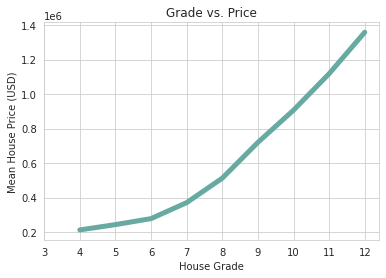

In [66]:
with sns.axes_style("whitegrid"):
    sns.lineplot(x = kch_df_grade['grade'], y = kch_df_grade['price'], lw = 5, color = '#66aaa2', data = kch_df_grade)
plt.xticks(range(3,13))    
plt.ylabel('Mean House Price (USD)')
plt.xlabel('House Grade')
plt.title('Grade vs. Price')
plt.show()

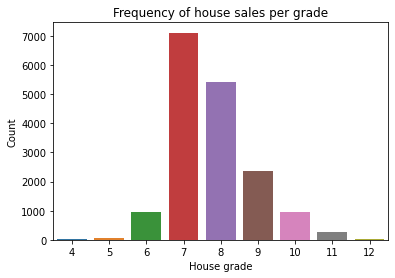

In [67]:
# Countplot of sale_month
sns.countplot(x = kch_df1['grade'], data = kch_df1)
plt.title('Frequency of house sales per grade')
plt.xlabel('House grade')
plt.ylabel('Count')
plt.show()

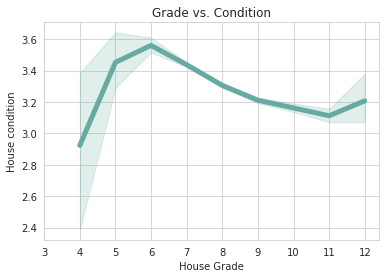

In [68]:
with sns.axes_style("whitegrid"):
    sns.lineplot(x = kch_df1['grade'], y = kch_df1['condition'], lw = 5, color = '#66aaa2', data = kch_df1)
plt.xticks(range(3,13))    
plt.ylabel('House condition')
plt.xlabel('House Grade')
plt.title('Grade vs. Condition')
plt.show()

In [69]:
# Groupby grade and take median price
kch_df_cond = kch_df1.groupby(kch_df1['condition'])['price'].mean().sort_values(ascending = False)

# Reset index after groupy
kch_df_cond = kch_df_cond.reset_index()

# Check
kch_df_cond

,condition,price
0,5,526520.462578
1,3,508945.449937
2,1,485142.857143
3,4,476082.457583
4,2,313864.294643


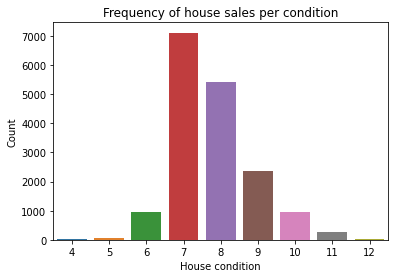

In [70]:
# Countplot of sale_month
sns.countplot(x = kch_df1['grade'], data = kch_df1)
plt.title('Frequency of house sales per condition')
plt.xlabel('House condition')
plt.ylabel('Count')
plt.show()

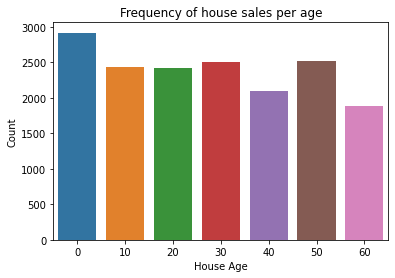

In [71]:
# Countplot of sale_month
sns.countplot(x = kch_df1['sold_at_age_bin'], data = kch_df1)
plt.title('Frequency of house sales per age')
plt.xlabel('House Age')
plt.ylabel('Count')
plt.show()

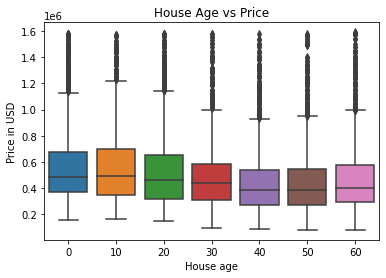

In [72]:
# Plot boxplot of sale month vs price
sns.boxplot(x = kch_df1['sold_at_age_bin'], y = kch_df1['price'], data = kch_df1)
plt.xlabel('House age')
plt.ylabel('Price in USD')
plt.title('House Age vs Price')
plt.show()

In [73]:
kch_df1_zip_wf_mean = kch_df1.groupby(['zipcode','waterfront'])['price'].mean().reset_index()

In [74]:
kch_df1_zip_wf_mean

,zipcode,waterfront,price
0,98001,0.0,283671.422741
1,98001,1.0,NaN
2,98002,0.0,239345.018182
3,98002,1.0,NaN
4,98003,0.0,293007.818841
...,...,...,...
135,98188,1.0,NaN
136,98198,0.0,288922.468254
137,98198,1.0,763142.857143
138,98199,0.0,747591.225989


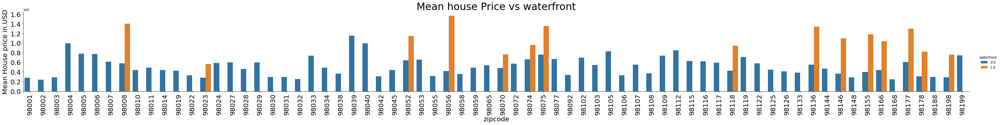

In [75]:
# plot
g = sns.catplot(x = 'zipcode', y = 'price', data =kch_df1_zip_wf_mean, hue = 'waterfront', kind = 'bar' , height = 4 , aspect = 10)
plt.title('Mean house Price vs waterfront',fontsize = 30)
plt.xlabel('zipcode', fontsize = 20)
plt.ylabel('Mean House price in USD', fontsize = 20)
plt.xticks(fontsize=20, rotation=90)
plt.yticks(fontsize=20)
plt.show()

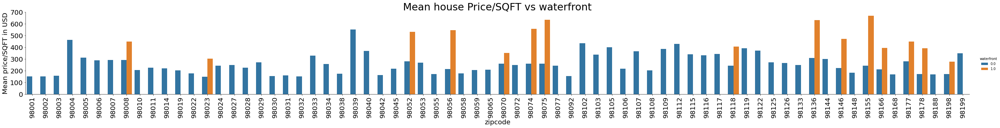

In [76]:
# Groupby grade and take median price
kch_df1_zip_wf_sqft_mean = kch_df1.groupby(['zipcode','waterfront'])['price_per_sqft'].mean().reset_index()
# plot
g = sns.catplot(x = 'zipcode', y = 'price_per_sqft', data =kch_df1_zip_wf_sqft_mean, hue = 'waterfront', kind = 'bar' , height = 4 , aspect = 10)
plt.title('Mean house Price/SQFT vs waterfront',fontsize = 30)
plt.xlabel('zipcode', fontsize = 20)
plt.ylabel('Mean price/SQFT in USD', fontsize = 20)
plt.xticks(fontsize=20, rotation=90)
plt.yticks(fontsize=20)
plt.show()

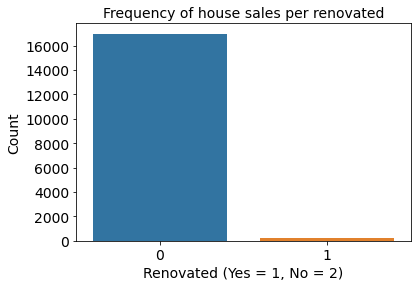

In [77]:
# Countplot of sale vs Renovation
sns.countplot(x = kch_df1['has_renovated'], data = kch_df1)
plt.title('Frequency of house sales per renovated', fontsize = 14)
plt.xlabel('Renovated (Yes = 1, No = 2)', fontsize = 14)
plt.ylabel('Count', fontsize = 14)
plt.xticks(fontsize = 14)
plt.yticks(fontsize = 14)
plt.show()

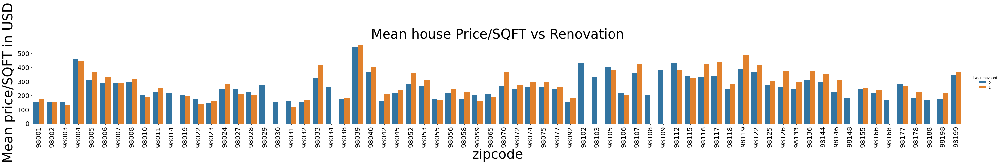

In [78]:
# Groupby grade and take median price
kch_df1_zip_re_sqft_mean = kch_df1.groupby(['zipcode','has_renovated'])['price_per_sqft'].mean().reset_index()
# plot
g = sns.catplot(x = 'zipcode', y = 'price_per_sqft', data =kch_df1_zip_re_sqft_mean, hue = 'has_renovated', kind = 'bar' , height = 4 , aspect = 10)
plt.title('Mean house Price/SQFT vs Renovation',fontsize = 40)
plt.xlabel('zipcode', fontsize = 40)
plt.ylabel('Mean price/SQFT in USD', fontsize = 40)
plt.xticks(fontsize=20, rotation=90)
plt.yticks(fontsize=20)
plt.show()

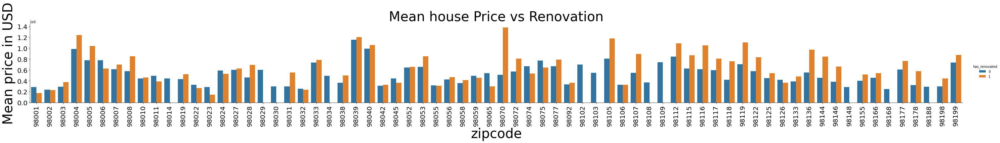

In [79]:
# Groupby grade and take median price
kch_df1_zip_re_mean = kch_df1.groupby(['zipcode','has_renovated'])['price'].mean().reset_index()
# plot
g = sns.catplot(x = 'zipcode', y = 'price', data =kch_df1_zip_re_mean, hue = 'has_renovated', kind = 'bar' , height = 4 , aspect = 10)
plt.title('Mean house Price vs Renovation',fontsize = 40)
plt.xlabel('zipcode', fontsize = 40)
plt.ylabel('Mean price in USD', fontsize = 40)
plt.xticks(fontsize=20, rotation=90)
plt.yticks(fontsize=20)
plt.show()

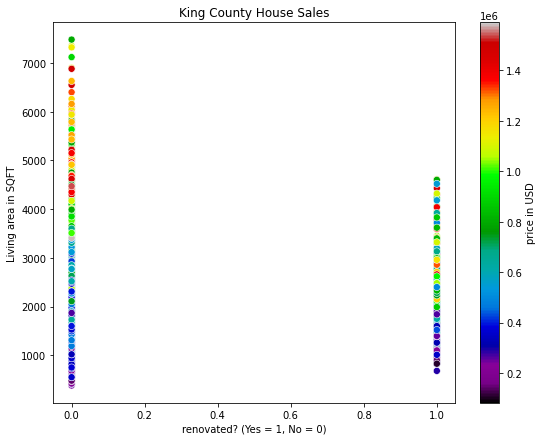

In [80]:

plt.figure(figsize = (9,7))
ax = sns.scatterplot(x = kch_df1['has_renovated'], y = kch_df1['sqft_living'], hue = kch_df1['price'],
                palette = 'nipy_spectral',s=50, legend = None, data = kch_df1)

norm = plt.Normalize(kch_df1['price'].min(), kch_df1['price'].max())
smap = plt.cm.ScalarMappable(cmap='nipy_spectral', norm=norm)
smap.set_array([])

ax.figure.colorbar(smap, label = 'price in USD')

plt.xlabel('renovated? (Yes = 1, No = 0)')
plt.ylabel('Living area in SQFT')
plt.title('King County House Sales')
plt.show()

## Price vs Time

In [81]:
# Define function to determine quarter
def quarter(month):
    ''' Returns quarter in which month falls'''
    if 1 <= month <= 3:
        quarter = 'Q1'
    elif 4 <= month <= 6:
        quarter = 'Q2'
    elif 7 <= month <= 9:
        quarter = 'Q3'
    else:
        quarter = 'Q4'
    return quarter

In [82]:
def sale_quarter_feature(df):
    ''' Creates quarter_sold feature using quarter function'''
    df['sale_quarter'] = df['mth_sold'].apply(quarter)
    return df

In [83]:
kch_df1 = sale_quarter_feature(kch_df1)
kch_df1['sale_quarter']

0        Q4
1        Q4
3        Q4
4        Q1
5        Q2
         ..
21592    Q2
21593    Q1
21594    Q2
21595    Q1
21596    Q4
Name: sale_quarter, Length: 17196, dtype: object

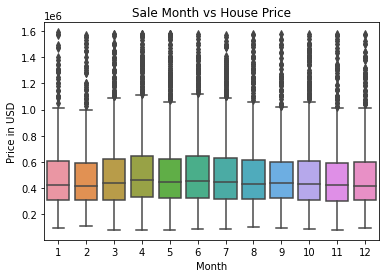

In [84]:
# Plot boxplot of sale month vs price
sns.boxplot(x = kch_df1['mth_sold'], y = kch_df1['price'], data = kch_df1)
plt.xlabel('Month')
plt.ylabel('Price in USD')
plt.title('Sale Month vs House Price')
plt.show()

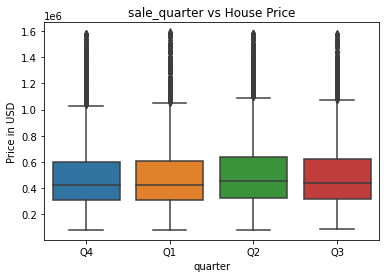

In [85]:
# Plot boxplot of sale month vs price
sns.boxplot(x = kch_df1['sale_quarter'], y = kch_df1['price'], data = kch_df1)
plt.xlabel('quarter')
plt.ylabel('Price in USD')
plt.title('sale_quarter vs House Price')
plt.show()

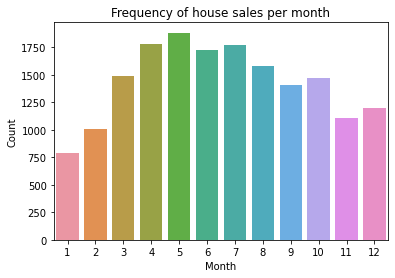

In [86]:
# Countplot of sale_month
sns.countplot(x = kch_df1['mth_sold'], data = kch_df1)
plt.title('Frequency of house sales per month')
plt.xlabel('Month')
plt.ylabel('Count')
plt.show()

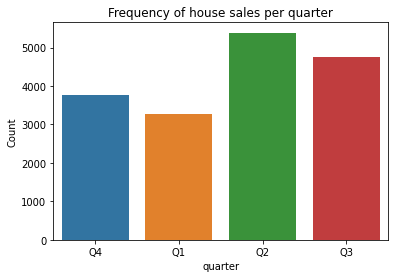

In [87]:
# Countplot of sale_quarter
sns.countplot(x = kch_df1['sale_quarter'], data = kch_df1)
plt.xlabel('quarter')
plt.ylabel('Count')
plt.title('Frequency of house sales per quarter')
plt.show()

In [88]:
quarter_sales = kch_df1['sale_quarter'].value_counts()/len(kch_df1)*100
quarter_sales = quarter_sales.sort_values('index').reset_index()
quarter_sales.columns = ['quarter', 'sales_in_percentage']
quarter_sales

,quarter,sales_in_percentage
0,Q1,19.091649
1,Q4,21.958595
2,Q3,27.628518
3,Q2,31.321237


<AxesSubplot:xlabel='sales_in_percentage', ylabel='quarter'>

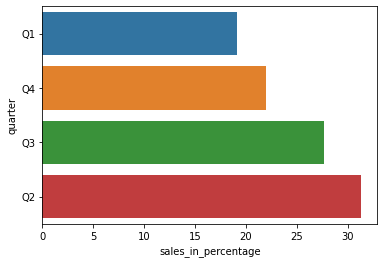

In [89]:
sns.barplot(x = quarter_sales['sales_in_percentage'],y = 'quarter', data = quarter_sales)

/Users/ds-admin/.pyenv/versions/3.8.5/lib/python3.8/site-packages/pandas/io/formats/format.py:1403: FutureWarning:

Index.ravel returning ndarray is deprecated; in a future version this will return a view on self.



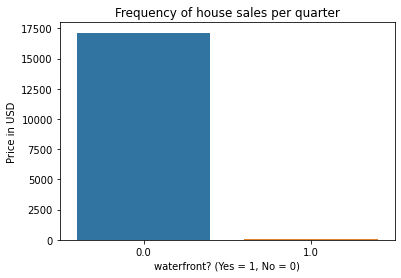

In [90]:
# Countplot of sale_quarter
sns.countplot(x = kch_df1['waterfront'], data = kch_df1)
plt.xlabel('waterfront? (Yes = 1, No = 0)')
plt.ylabel('Price in USD')
plt.title('Frequency of house sales per quarter')
plt.show()

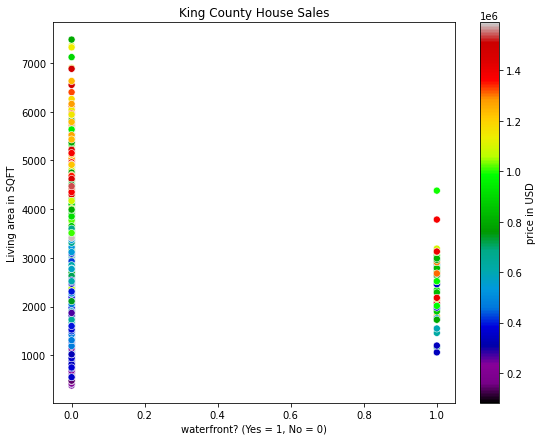

In [91]:

plt.figure(figsize = (9,7))
ax = sns.scatterplot(x = kch_df1['waterfront'], y = kch_df1['sqft_living'], hue = kch_df1['price'],
                palette = 'nipy_spectral',s=50, legend = None, data = kch_df1)

norm = plt.Normalize(kch_df1['price'].min(), kch_df1['price'].max())
smap = plt.cm.ScalarMappable(cmap='nipy_spectral', norm=norm)
smap.set_array([])

ax.figure.colorbar(smap, label = 'price in USD')

plt.xlabel('waterfront? (Yes = 1, No = 0)')
plt.ylabel('Living area in SQFT')
plt.title('King County House Sales')
plt.show()

# Ordinary Least Squares (OLS)

In [92]:
def ols_model(df,col):
    model = '+'.join(x for x in cols[1:])
    model = 'price ~ '+ model
    model
    summary = smf.ols(formula=model, data=df).fit()
    return summary

In [93]:
df = kch_df1
cols = kch_df1.columns
cols = cols.drop(["price_per_sqft","mth_sold",'sale_quarter','yr_sold','sqft_lot15','has_basement','sold_at_age_bin'])
#cols = ['price', 'bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot', 'floors',
#        'waterfront', 'condition', 'grade', 'sqft_above', 'zipcode','sqft_living15', 
#        'sqft_lot15','has_viewed', 'has_renovated', 'has_basement', 'sold_at_age_bin']
results = ols_model(df,cols[:1])
print('Parameters: ', results.params)
print('R2: ', results.rsquared)
print(results.summary())

Parameters:  Intercept       -2.613783e+07
bedrooms[T.2]   -3.750397e+04
bedrooms[T.3]   -3.914152e+04
bedrooms[T.4]   -4.583287e+04
bedrooms[T.5]   -5.995837e+04
                     ...     
grade            5.211548e+04
sqft_above       4.955177e+01
lat              1.979232e+05
long            -1.339539e+05
sqft_living15    2.868297e+01
Length: 100, dtype: float64
R2:  0.8509737030312043
                            OLS Regression Results                            
Dep. Variable:                  price   R-squared:                       0.851
Model:                            OLS   Adj. R-squared:                  0.850
Method:                 Least Squares   F-statistic:                     996.2
Date:                Tue, 01 Jun 2021   Prob (F-statistic):               0.00
Time:                        11:06:05   Log-Likelihood:            -2.2197e+05
No. Observations:               17196   AIC:                         4.441e+05
Df Residuals:                   17097   BIC:        

In [94]:
zipcode_dummies = pd.get_dummies(kch_df1.zipcode, prefix='zip')
zipcode_dummies.describe()
kch_df2 = kch_df1.join(zipcode_dummies)
kch_df2 = kch_df2.drop('zipcode', axis = 1)
kch_df2.head(2)

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,condition,grade,sqft_above,...,zip_98146,zip_98148,zip_98155,zip_98166,zip_98168,zip_98177,zip_98178,zip_98188,zip_98198,zip_98199
0,221900.0,3,1,1180,5650,1.0,0.0,3,7,1180,...,0,0,0,0,0,0,1,0,0,0
1,538000.0,3,2,2570,7242,2.0,0.0,3,7,2170,...,0,0,0,0,0,0,0,0,0,0


In [95]:
df = kch_df2
cols = df.columns
cols = cols.drop(["price_per_sqft","mth_sold",'sale_quarter','yr_sold','sqft_lot15','has_basement','sold_at_age_bin', 'zip_98112','zip_98040'])
#cols = ['price', 'bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot', 'floors',
#        'waterfront', 'condition', 'grade', 'sqft_above', 'zipcode','sqft_living15', 
#        'sqft_lot15','has_viewed', 'has_renovated', 'has_basement', 'sold_at_age_bin']
results = ols_model(df,cols[:1])
print('Parameters: ', results.params)
print('R2: ', results.rsquared)
print(results.summary())

Parameters:  Intercept       -2.616392e+07
bedrooms[T.2]   -3.754418e+04
bedrooms[T.3]   -3.921475e+04
bedrooms[T.4]   -4.591930e+04
bedrooms[T.5]   -6.006675e+04
                     ...     
zip_98177       -3.123313e+05
zip_98178       -4.294404e+05
zip_98188       -4.292793e+05
zip_98198       -4.424384e+05
zip_98199       -1.437656e+05
Length: 99, dtype: float64
R2:  0.8509716148334201
                            OLS Regression Results                            
Dep. Variable:                  price   R-squared:                       0.851
Model:                            OLS   Adj. R-squared:                  0.850
Method:                 Least Squares   F-statistic:                     1007.
Date:                Tue, 01 Jun 2021   Prob (F-statistic):               0.00
Time:                        11:06:05   Log-Likelihood:            -2.2197e+05
No. Observations:               17196   AIC:                         4.441e+05
Df Residuals:                   17098   BIC:         

In [96]:
bathroom_dummies = pd.get_dummies(kch_df2.bathrooms, prefix='bathroom')
kch_df3 = kch_df2.join(bathroom_dummies)
kch_df3 = kch_df3.drop('bathrooms', axis = 1)
df = kch_df3
cols = df.columns
cols = cols.drop(["price_per_sqft","mth_sold",'sale_quarter','yr_sold','sqft_lot15','has_basement','sold_at_age_bin', 'zip_98112','zip_98040'])
results = ols_model(df,cols[:1])
print('Parameters: ', results.params)
print('R2: ', results.rsquared)
print(results.summary())

Parameters:  Intercept       -2.346073e+07
bedrooms[T.2]   -3.754418e+04
bedrooms[T.3]   -3.921475e+04
bedrooms[T.4]   -4.591930e+04
bedrooms[T.5]   -6.006675e+04
                     ...     
bathroom_4      -2.646930e+06
bathroom_5      -2.660430e+06
bathroom_6      -2.759621e+06
bathroom_7      -3.076767e+06
bathroom_8      -1.521749e+06
Length: 100, dtype: float64
R2:  0.8509716148334202
                            OLS Regression Results                            
Dep. Variable:                  price   R-squared:                       0.851
Model:                            OLS   Adj. R-squared:                  0.850
Method:                 Least Squares   F-statistic:                     1007.
Date:                Tue, 01 Jun 2021   Prob (F-statistic):               0.00
Time:                        11:06:06   Log-Likelihood:            -2.2197e+05
No. Observations:               17196   AIC:                         4.441e+05
Df Residuals:                   17098   BIC:        

In [97]:
bedroom_dummies = pd.get_dummies(kch_df3.bedrooms, prefix='bedroom')
kch_df4 = kch_df3.join(bedroom_dummies)
kch_df4 = kch_df4.drop('bedrooms', axis = 1)
df = kch_df4
cols = df.columns
cols = cols.drop(["price_per_sqft","mth_sold",'sale_quarter','yr_sold','sqft_lot15','has_basement','sold_at_age_bin', 'zip_98112','zip_98040'])
results = ols_model(df,cols[:1])
print('Parameters: ', results.params)
print('R2: ', results.rsquared)
print(results.summary())

Parameters:  Intercept            -2.187606e+07
waterfront[T.1.0]     3.607501e+05
has_viewed[T.1]       9.271195e+04
has_renovated[T.1]    9.461093e+04
sqft_living           8.084322e+01
                          ...     
bedroom_7            -2.038754e+06
bedroom_8            -2.053141e+06
bedroom_9            -2.314082e+06
bedroom_10           -2.086371e+06
bedroom_33           -1.827238e+06
Length: 101, dtype: float64
R2:  0.8509716148334204
                            OLS Regression Results                            
Dep. Variable:                  price   R-squared:                       0.851
Model:                            OLS   Adj. R-squared:                  0.850
Method:                 Least Squares   F-statistic:                     1007.
Date:                Tue, 01 Jun 2021   Prob (F-statistic):               0.00
Time:                        11:06:06   Log-Likelihood:            -2.2197e+05
No. Observations:               17196   AIC:                         4.441e+

In [98]:
model = 'price ~ + waterfront'
results = smf.ols(formula=model, data=df).fit()
print('Parameters: ', results.params)
print('R2: ', results.rsquared)
print(results.summary())

Parameters:  Intercept            499312.453140
waterfront[T.1.0]    446094.689717
dtype: float64
R2:  0.008833129811347984
                            OLS Regression Results                            
Dep. Variable:                  price   R-squared:                       0.009
Model:                            OLS   Adj. R-squared:                  0.009
Method:                 Least Squares   F-statistic:                     153.2
Date:                Tue, 01 Jun 2021   Prob (F-statistic):           4.81e-35
Time:                        11:06:06   Log-Likelihood:            -2.3826e+05
No. Observations:               17196   AIC:                         4.765e+05
Df Residuals:                   17194   BIC:                         4.765e+05
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                        coef    std err          t      P>|t|      [0.025      0.975]


In [99]:
model = 'price ~ + has_renovated'
results = smf.ols(formula=model, data=df).fit()
print('Parameters: ', results.params)
print('R2: ', results.rsquared)
print(results.summary())

Parameters:  Intercept             497935.931400
has_renovated[T.1]    199689.945793
dtype: float64
R2:  0.008149935632790095
                            OLS Regression Results                            
Dep. Variable:                  price   R-squared:                       0.008
Model:                            OLS   Adj. R-squared:                  0.008
Method:                 Least Squares   F-statistic:                     141.3
Date:                Tue, 01 Jun 2021   Prob (F-statistic):           1.87e-32
Time:                        11:06:06   Log-Likelihood:            -2.3827e+05
No. Observations:               17196   AIC:                         4.765e+05
Df Residuals:                   17194   BIC:                         4.766e+05
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                         coef    std err          t      P>|t|      [0.025      0.97

In [100]:
model = 'price ~ + mth_sold'
results = smf.ols(formula=model, data=df).fit()
print('Parameters: ', results.params)
print('R2: ', results.rsquared)
print(results.summary())

Parameters:  Intercept    507728.970442
mth_sold      -1086.870454
dtype: float64
R2:  0.0001798081333070911
                            OLS Regression Results                            
Dep. Variable:                  price   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                  0.000
Method:                 Least Squares   F-statistic:                     3.092
Date:                Tue, 01 Jun 2021   Prob (F-statistic):             0.0787
Time:                        11:06:06   Log-Likelihood:            -2.3834e+05
No. Observations:               17196   AIC:                         4.767e+05
Df Residuals:                   17194   BIC:                         4.767e+05
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------

## Correlation

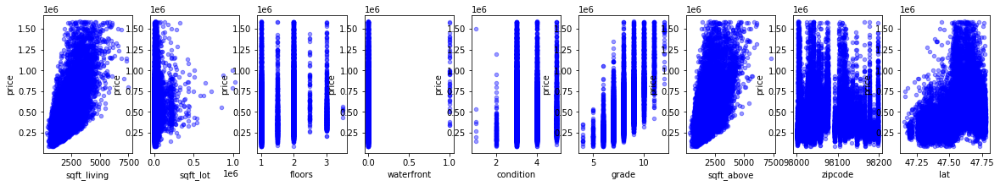

In [101]:
cols = kch_data.columns
fig, axes = plt.subplots(nrows=1, ncols=9, figsize=(20,3))
for xcol, ax in zip(cols[3:], axes):
    kch_data.plot(kind='scatter', x=xcol, y='price', ax=ax, alpha=0.4, color='b')

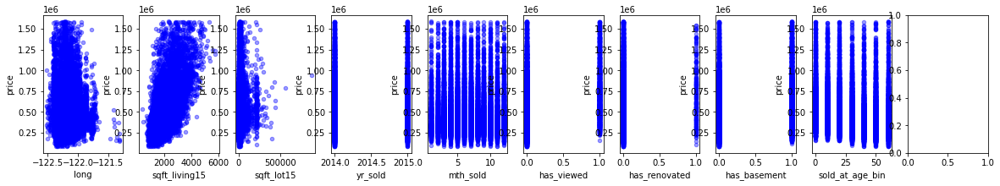

In [102]:
fig, axes = plt.subplots(nrows=1, ncols=10, figsize=(20,3))
for xcol, ax in zip(cols[12:], axes):
    kch_data.plot(kind='scatter', x=xcol, y='price', ax=ax, alpha=0.4, color='b')

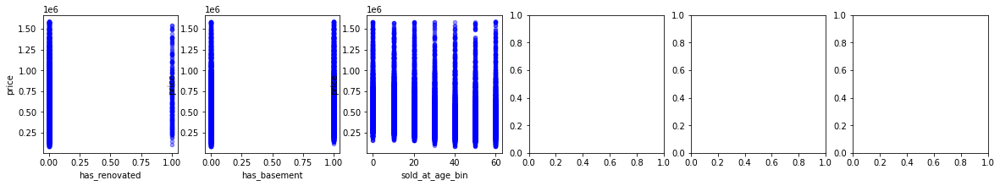

In [103]:
fig, axes = plt.subplots(nrows=1, ncols=6, figsize=(20,3))
for xcol, ax in zip(cols[18:], axes):
    kch_data.plot(kind='scatter', x=xcol, y='price', ax=ax, alpha=0.4, color='b')

In [104]:
kch_data.corr() > 0.5

,price,sqft_living,sqft_lot,floors,condition,grade,sqft_above,zipcode,lat,long,sqft_living15,sqft_lot15,yr_sold,mth_sold
price,True,True,False,False,False,True,True,False,False,False,True,False,False,False
sqft_living,True,True,False,False,False,True,True,False,False,False,True,False,False,False
sqft_lot,False,False,True,False,False,False,False,False,False,False,False,True,False,False
floors,False,False,False,True,False,False,False,False,False,False,False,False,False,False
condition,False,False,False,False,True,False,False,False,False,False,False,False,False,False
grade,True,True,False,False,False,True,True,False,False,False,True,False,False,False
sqft_above,True,True,False,False,False,True,True,False,False,False,True,False,False,False
zipcode,False,False,False,False,False,False,False,True,False,False,False,False,False,False
lat,False,False,False,False,False,False,False,False,True,False,False,False,False,False
long,False,False,False,False,False,False,False,False,False,True,False,False,False,False


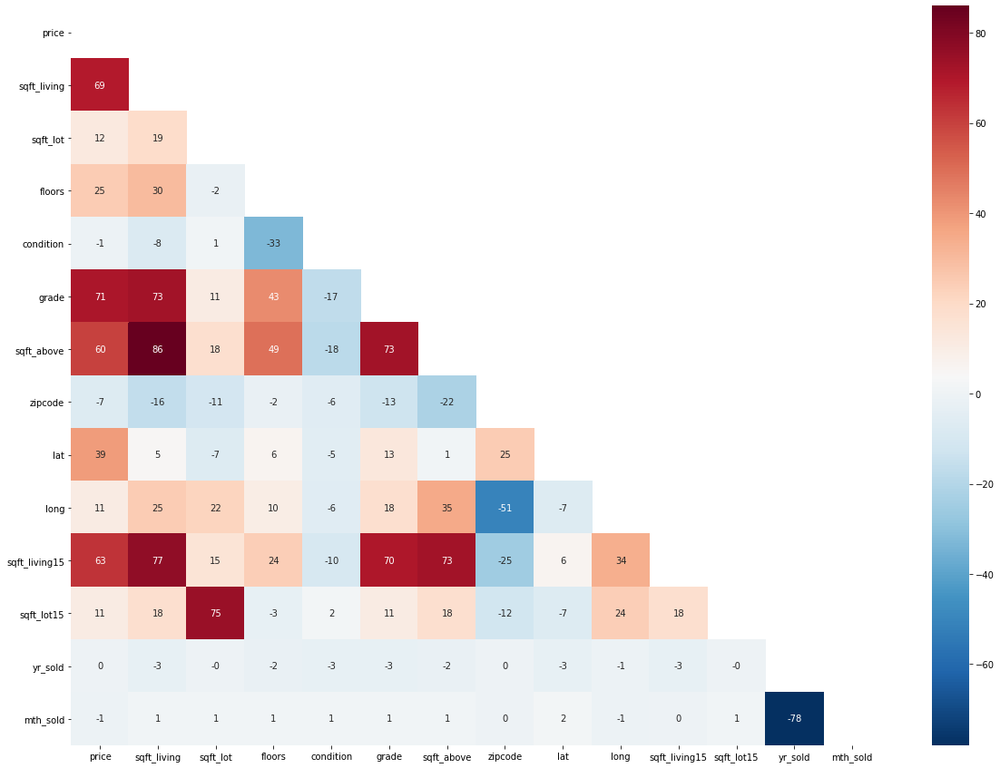

In [105]:
df = kch_data
mask = np.triu(df.corr())
plt.figure(figsize = (20,15))
ax = sns.heatmap(round(df.corr()*100)
                 ,annot=True
                 ,mask=mask
                 ,cmap='RdBu_r')

In [106]:
round(kch_data.corr()*100)

,price,sqft_living,sqft_lot,floors,condition,grade,sqft_above,zipcode,lat,long,sqft_living15,sqft_lot15,yr_sold,mth_sold
price,100.0,69.0,12.0,25.0,-1.0,71.0,60.0,-7.0,39.0,11.0,63.0,11.0,0.0,-1.0
sqft_living,69.0,100.0,19.0,30.0,-8.0,73.0,86.0,-16.0,5.0,25.0,77.0,18.0,-3.0,1.0
sqft_lot,12.0,19.0,100.0,-2.0,1.0,11.0,18.0,-11.0,-7.0,22.0,15.0,75.0,-0.0,1.0
floors,25.0,30.0,-2.0,100.0,-33.0,43.0,49.0,-2.0,6.0,10.0,24.0,-3.0,-2.0,1.0
condition,-1.0,-8.0,1.0,-33.0,100.0,-17.0,-18.0,-6.0,-5.0,-6.0,-10.0,2.0,-3.0,1.0
grade,71.0,73.0,11.0,43.0,-17.0,100.0,73.0,-13.0,13.0,18.0,70.0,11.0,-3.0,1.0
sqft_above,60.0,86.0,18.0,49.0,-18.0,73.0,100.0,-22.0,1.0,35.0,73.0,18.0,-2.0,1.0
zipcode,-7.0,-16.0,-11.0,-2.0,-6.0,-13.0,-22.0,100.0,25.0,-51.0,-25.0,-12.0,0.0,0.0
lat,39.0,5.0,-7.0,6.0,-5.0,13.0,1.0,25.0,100.0,-7.0,6.0,-7.0,-3.0,2.0
long,11.0,25.0,22.0,10.0,-6.0,18.0,35.0,-51.0,-7.0,100.0,34.0,24.0,-1.0,-1.0


In [107]:
explanatory_vars = df.columns[1:]
explanatory_vars
print('R squared for each possible explanatory variable:' )
for explanatory_var in explanatory_vars:
    model = 'price ~ {:}'.format(explanatory_var)
    rs = smf.ols(formula=model, data=kch_data).fit().rsquared
    print('{:7s} \t \t= {:.3}'.format(explanatory_var, rs))

R squared for each possible explanatory variable:
bedrooms 	 	= 0.11
bathrooms 	 	= 0.243
sqft_living 	 	= 0.476
sqft_lot 	 	= 0.0152
floors  	 	= 0.0629
waterfront 	 	= 0.00883
condition 	 	= 0.000156
grade   	 	= 0.5
sqft_above 	 	= 0.358
zipcode 	 	= 0.00436
lat     	 	= 0.151
long    	 	= 0.0119
sqft_living15 	 	= 0.395
sqft_lot15 	 	= 0.0124
yr_sold 	 	= 2.37e-05
mth_sold 	 	= 0.00018
has_viewed 	 	= 0.0937
has_renovated 	 	= 0.00815
has_basement 	 	= 0.0177
sold_at_age_bin 	 	= 0.0332


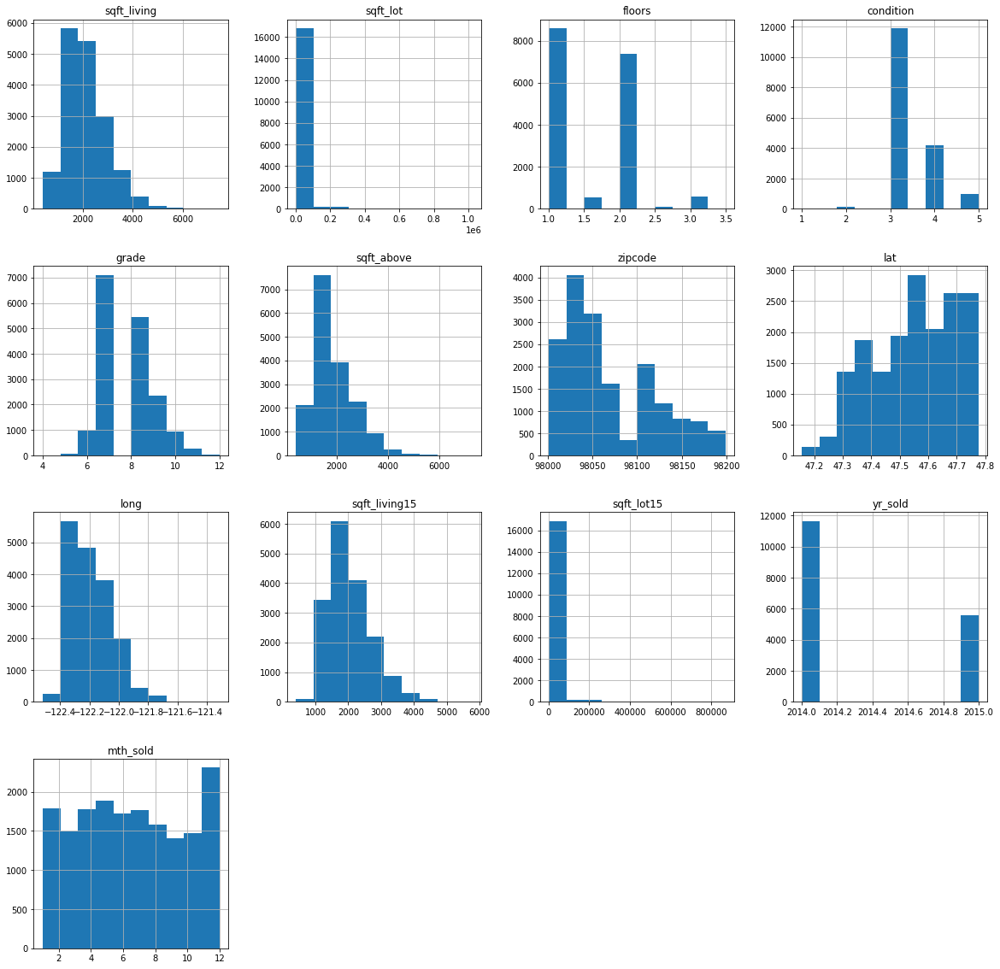

In [108]:
import warnings
warnings.filterwarnings('ignore')
fig = plt.figure(figsize = (20,20))
ax = fig.gca()
kch_data[cols[3:]].hist(ax = ax);

In [109]:
explanatory_vars = cols[1:]
explanatory_vars

Index(['bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot', 'floors',
       'waterfront', 'condition', 'grade', 'sqft_above', 'zipcode', 'lat',
       'long', 'sqft_living15', 'sqft_lot15', 'yr_sold', 'mth_sold',
       'has_viewed', 'has_renovated', 'has_basement', 'sold_at_age_bin'],
      dtype='object')

In [110]:
print('R squared for each possible explanatory variable:' )
for explanatory_var in explanatory_vars:
    model = 'price ~ {:}'.format(explanatory_var)
    rs = smf.ols(formula=model, data=kch_data).fit().rsquared
    print('{:7s} \t \t= {:.3}'.format(explanatory_var, rs))

R squared for each possible explanatory variable:
bedrooms 	 	= 0.11
bathrooms 	 	= 0.243
sqft_living 	 	= 0.476
sqft_lot 	 	= 0.0152
floors  	 	= 0.0629
waterfront 	 	= 0.00883
condition 	 	= 0.000156
grade   	 	= 0.5
sqft_above 	 	= 0.358
zipcode 	 	= 0.00436
lat     	 	= 0.151
long    	 	= 0.0119
sqft_living15 	 	= 0.395
sqft_lot15 	 	= 0.0124
yr_sold 	 	= 2.37e-05
mth_sold 	 	= 0.00018
has_viewed 	 	= 0.0937
has_renovated 	 	= 0.00815
has_basement 	 	= 0.0177
sold_at_age_bin 	 	= 0.0332


array([[<AxesSubplot:title={'center':'sqft_living'}>,
        <AxesSubplot:title={'center':'sqft_lot'}>,
        <AxesSubplot:title={'center':'floors'}>,
        <AxesSubplot:title={'center':'condition'}>],
       [<AxesSubplot:title={'center':'grade'}>,
        <AxesSubplot:title={'center':'sqft_above'}>,
        <AxesSubplot:title={'center':'zipcode'}>,
        <AxesSubplot:title={'center':'lat'}>],
       [<AxesSubplot:title={'center':'long'}>,
        <AxesSubplot:title={'center':'sqft_living15'}>,
        <AxesSubplot:title={'center':'sqft_lot15'}>,
        <AxesSubplot:title={'center':'yr_sold'}>],
       [<AxesSubplot:title={'center':'mth_sold'}>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>]], dtype=object)

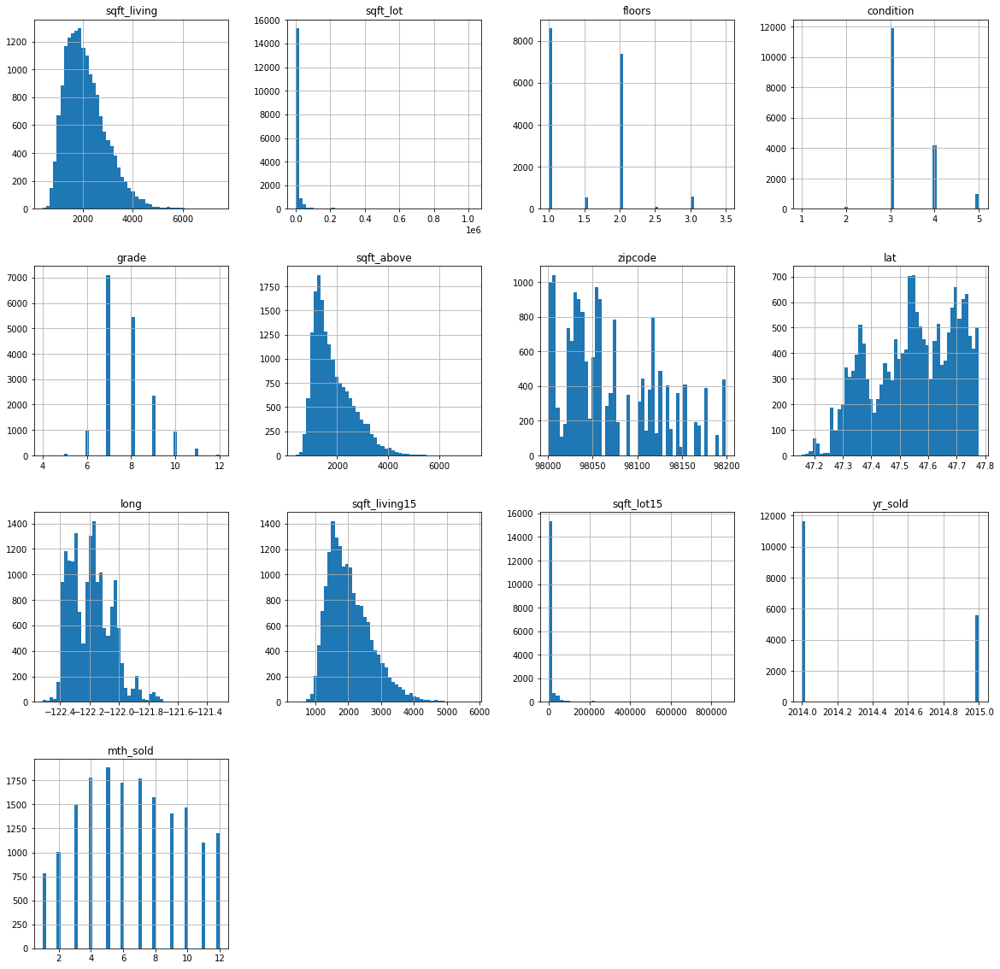

In [111]:
kch_data[cols[3:]].hist(figsize=(20, 20), bins=50, xlabelsize=10, ylabelsize=10)